<a href="https://colab.research.google.com/github/ItsRajSingh/ComputerVisionLearning/blob/main/Fall-Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Step # 01 Install All the Required Packages**

In [1]:
!pip install ultralytics

**Step # 02 Import All the Required Libraries**

In [2]:
import ultralytics
from ultralytics import YOLO

**Step # 03 Check Ultralytics Version and Setup Completion**

In [4]:
ultralytics.checks()

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.4/112.6 GB disk)


**Step 04: Download the Dataset from Roboflow**

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hzoVrDHDbdeFNRLoh2Nq")
project = rf.workspace("pose-detection-twxbg").project("human-activity-ce7zu")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


In [6]:
!gdown "https://drive.google.com/uc?id=1kSI3LP8hVRw7dY678sH9OGmdnH7Zi-CE&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1kSI3LP8hVRw7dY678sH9OGmdnH7Zi-CE&confirm=t
To: /content/Human activity.v2i.yolov8.zip
100% 61.3M/61.3M [00:01<00:00, 31.5MB/s]


In [7]:
!mkdir dataset

In [13]:
%cd "/content/dataset/"

/content/dataset


In [14]:
!unzip "/content/Human activity.v2i.yolov8.zip"

Archive:  /content/Human activity.v2i.yolov8.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/Screenshot-2024-09-25-at-7-20-15-PM_png.rf.882f7e6e65ab2ea72187a5edc3b6fb6b.jpg  
 extracting: test/images/Screenshot-2024-09-25-at-8-43-41-PM_png.rf.1b34e7fd2dfc832c10eb8b0968fe403e.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0063_jpg.rf.4698870fb3fb543582d27ff079d6bdc9.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0072_jpg.rf.6fd2fac18d418e72b3911d7e6420f1c9.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0376_jpg.rf.e061f9f2cc36cc35b7ee873775301677.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1d_mp4-0377_jpg.rf.0c34807744198e1e6ee6a610c5a657cf.jpg  
 extracting: test/images/clideo_editor_2229b5e08e5745e6a3b63e1b91f4de1

In [15]:
!pwd
%cd /content/

/content/dataset
/content


In [ ]:
# *** Change path in data.yaml file for Google Colab ***
# path: /content/dataset
# test: test/images    # relative to 'path'
# train: train/images  # relative to 'path'
# val: valid/images    # relative to 'path'

**Step # 05 Load the YOLO11 Model**

In [16]:
model = YOLO("yolo11s-pose.pt")

100%|██████████| 19.4M/19.4M [00:00<00:00, 74.5MB/s]


**Step # 06 Train the YOLO11 Pose Model**

In [17]:
results = model.train(data = "/content/dataset/data.yaml", task = "pose", mode = "train", imgsz = 640, epochs = 50, batch = 8)

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=pose, mode=train, model=yolo11s-pose.pt, data=/content/dataset/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

100%|██████████| 755k/755k [00:00<00:00, 21.7MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 80.8MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset/train/labels... 1126 images, 3 backgrounds, 3 corrupt: 100%|██████████| 1126/1126 [00:00<00:00, 1475.08it/s]

train: WARNING ⚠️ /content/dataset/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0048_jpg.rf.3d6a4188d2279fd1b429fcfa0a6ce0eb.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: WARNING ⚠️ /content/dataset/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0049_jpg.rf.245067ff6f6ebf7ab9b38b346ad24ed7.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: WARNING ⚠️ /content/dataset/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0050_jpg.rf.0304242590c31d28441b27bb05c37ee5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: New cache created: /content/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset/valid/labels... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<00:00, 561.75it/s]

val: New cache created: /content/dataset/valid/labels.cache


Plotting labels to runs/pose/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.29G      1.434      5.847     0.4358      2.852      1.354          4        640: 100%|██████████| 141/141 [00:33<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.56it/s]

                   all        324        326      0.649      0.686      0.728      0.426      0.295      0.386      0.318      0.105



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.73G      1.435       5.62     0.3649      1.824      1.322          4        640: 100%|██████████| 141/141 [00:28<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.77it/s]

                   all        324        326      0.918      0.441      0.707      0.412      0.287      0.329      0.255     0.0634



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.77G      1.455      5.656     0.3895      1.608      1.352          8        640: 100%|██████████| 141/141 [00:29<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.71it/s]

                   all        324        326      0.633      0.559      0.606      0.317      0.289      0.294      0.233     0.0655



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.8G      1.477      5.436     0.3744      1.523      1.353          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.45it/s]


                   all        324        326      0.816      0.623      0.784       0.47      0.642      0.499      0.522      0.139

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.85G      1.386      5.189     0.3617      1.369      1.301          4        640: 100%|██████████| 141/141 [00:28<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.69it/s]

                   all        324        326      0.766      0.792      0.833       0.54      0.601      0.594      0.575      0.143



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.88G      1.332      4.934     0.3509      1.283       1.28          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.01it/s]


                   all        324        326      0.848      0.794      0.863      0.585       0.68      0.603      0.531      0.162

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.93G      1.291      4.635     0.3387      1.175      1.256          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.64it/s]

                   all        324        326       0.82      0.845      0.883      0.601      0.668      0.681       0.66       0.24



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.97G      1.292      4.591     0.3404      1.185      1.254          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.59it/s]

                   all        324        326      0.833      0.837      0.892      0.598      0.703      0.692      0.712      0.276



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.01G      1.243      4.286     0.3378      1.081      1.225          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.64it/s]

                   all        324        326      0.786      0.849       0.88      0.609      0.667      0.702      0.654      0.251



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.05G      1.216      4.287     0.3208      1.076      1.209          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.52it/s]

                   all        324        326      0.855      0.874      0.899      0.612      0.712      0.729      0.682       0.23



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      11/50       3.1G      1.207      3.997     0.3118      1.012      1.204          7        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.68it/s]

                   all        324        326      0.885      0.856      0.904       0.63      0.765      0.727      0.704      0.246



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.14G      1.172      3.958      0.302      1.014      1.202          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.61it/s]

                   all        324        326       0.85      0.901      0.927      0.641      0.737       0.79      0.756       0.32



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.18G      1.151      3.854     0.3072     0.9729      1.178          8        640: 100%|██████████| 141/141 [00:28<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.74it/s]

                   all        324        326      0.865      0.864      0.917      0.643      0.798      0.756      0.776      0.386



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.22G      1.141        3.9      0.299      0.932      1.185          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.54it/s]

                   all        324        326      0.845      0.871       0.91      0.637      0.763       0.74      0.758      0.352



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.27G      1.128      3.761     0.2986      0.916      1.171          4        640: 100%|██████████| 141/141 [00:28<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.69it/s]

                   all        324        326      0.827      0.895      0.912      0.641      0.734      0.794      0.752      0.329



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.31G      1.082      3.582     0.2839     0.8693      1.149          4        640: 100%|██████████| 141/141 [00:28<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.95it/s]

                   all        324        326      0.903      0.861      0.923      0.655      0.818      0.779        0.8      0.374



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.51G      1.121      3.706     0.2896     0.9006      1.172          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.68it/s]

                   all        324        326      0.841        0.9       0.92       0.67      0.748      0.789      0.763      0.359



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.56G      1.078      3.444     0.2788     0.8657      1.147          5        640: 100%|██████████| 141/141 [00:28<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.23it/s]

                   all        324        326      0.859      0.888       0.91      0.684      0.768      0.791      0.784      0.407



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      19/50       3.6G      1.033       3.36     0.2699     0.8122      1.126          2        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.68it/s]

                   all        324        326      0.873        0.9      0.917       0.65      0.787      0.811      0.781      0.353



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.64G      1.049      3.278     0.2602     0.8338      1.133          7        640: 100%|██████████| 141/141 [00:29<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.52it/s]

                   all        324        326      0.848      0.925       0.94      0.689      0.754      0.829      0.804      0.418



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.68G      1.033      3.244     0.2576     0.7991      1.119          9        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.54it/s]

                   all        324        326      0.877      0.911       0.94      0.705       0.78      0.806      0.795      0.379



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.72G      1.013      3.309     0.2741     0.7856      1.119          6        640: 100%|██████████| 141/141 [00:28<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.77it/s]

                   all        324        326      0.924       0.91       0.95      0.705      0.839      0.821      0.832      0.444



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.77G      1.023      3.317     0.2663     0.8126      1.124          4        640: 100%|██████████| 141/141 [00:28<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.39it/s]

                   all        324        326      0.887      0.911      0.928      0.696      0.788       0.81      0.811       0.41



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.81G      1.044      3.304     0.2613     0.7819      1.136          5        640: 100%|██████████| 141/141 [00:28<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.72it/s]

                   all        324        326      0.866      0.929      0.945      0.704      0.785      0.843      0.839      0.402



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.85G     0.9617      3.038     0.2529     0.7302      1.085          9        640: 100%|██████████| 141/141 [00:27<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.95it/s]

                   all        324        326      0.868      0.934      0.942      0.714      0.848      0.817      0.868      0.402



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      26/50       3.9G     0.9376      2.982     0.2505     0.7428      1.085          5        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.65it/s]

                   all        324        326       0.89      0.904      0.944       0.73      0.811      0.821       0.84       0.44



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.94G     0.9707      2.954     0.2516     0.7319      1.093          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.67it/s]

                   all        324        326      0.934      0.903      0.952      0.718      0.843      0.811      0.848       0.45



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.98G      0.965      2.901     0.2508     0.7566      1.086          2        640: 100%|██████████| 141/141 [00:27<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.83it/s]

                   all        324        326      0.875      0.922      0.942      0.698      0.843       0.84      0.848      0.451



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.02G     0.9445       2.86     0.2567     0.7362      1.082          7        640: 100%|██████████| 141/141 [00:28<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.73it/s]

                   all        324        326      0.873      0.906      0.941      0.713      0.806      0.816      0.832      0.431



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.07G     0.9245      2.724     0.2439     0.7265      1.086          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.80it/s]

                   all        324        326      0.923      0.929      0.945       0.72      0.847      0.861      0.849      0.461



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.11G     0.9155      2.824     0.2462     0.6892      1.077          4        640: 100%|██████████| 141/141 [00:28<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.48it/s]

                   all        324        326      0.923      0.925      0.957      0.723      0.867       0.85       0.87      0.461



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.15G     0.9332      2.691     0.2402     0.7084      1.084          1        640: 100%|██████████| 141/141 [00:28<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.62it/s]

                   all        324        326      0.889      0.924      0.954      0.736      0.843      0.874      0.891      0.508



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.19G     0.8847      2.622     0.2378     0.6705       1.06          5        640: 100%|██████████| 141/141 [00:28<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.62it/s]

                   all        324        326      0.888      0.905      0.945      0.741      0.858      0.833      0.865      0.495



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.24G     0.8992      2.568     0.2322     0.6869      1.058         10        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.71it/s]

                   all        324        326      0.931      0.881      0.951      0.747      0.883      0.828      0.869      0.521



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.28G     0.8933      2.557      0.229      0.648      1.066          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.76it/s]

                   all        324        326      0.907      0.911      0.949      0.742      0.847      0.846      0.864      0.527



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.32G     0.8598      2.498     0.2355     0.6519      1.052          2        640: 100%|██████████| 141/141 [00:27<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.79it/s]

                   all        324        326      0.943       0.92      0.958      0.757      0.894      0.873      0.887      0.525



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.36G     0.8598      2.478     0.2299     0.6414      1.047          4        640: 100%|██████████| 141/141 [00:28<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.96it/s]

                   all        324        326      0.892      0.951      0.953      0.753      0.844      0.898      0.886      0.526



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.41G     0.8602      2.495     0.2279     0.6374      1.063          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.77it/s]

                   all        324        326      0.928       0.92      0.957      0.748      0.883      0.837      0.873      0.545



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.45G      0.821      2.442     0.2393     0.6256      1.035          3        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.15it/s]

                   all        324        326      0.944      0.889      0.953      0.759      0.901      0.845      0.884       0.55



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.49G     0.8488      2.379     0.2261     0.6381      1.045          7        640: 100%|██████████| 141/141 [00:28<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.76it/s]

                   all        324        326      0.935      0.911      0.957      0.759      0.903      0.877      0.911      0.578


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.56G     0.7558      1.809     0.1935     0.5176      1.025          3        640: 100%|██████████| 141/141 [00:29<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.75it/s]

                   all        324        326      0.927       0.91      0.955      0.769      0.887       0.87      0.895      0.572



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.61G     0.7286      1.697     0.1903     0.4908      1.002          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.61it/s]

                   all        324        326      0.933      0.895      0.954      0.762      0.904      0.861      0.907      0.584



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.65G     0.7228      1.633     0.1826     0.4877      1.001          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.68it/s]

                   all        324        326      0.941      0.917      0.954      0.767      0.901      0.877      0.897      0.579



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.69G     0.6943       1.59     0.1761     0.4729      1.001          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.52it/s]

                   all        324        326       0.93      0.928      0.961      0.783      0.907      0.905      0.936      0.598



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.77G     0.6835      1.589     0.1736     0.4683     0.9808          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.71it/s]

                   all        324        326      0.913      0.947      0.964      0.783       0.88      0.905       0.91      0.612



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.81G     0.6756      1.554     0.1758     0.4532     0.9792          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.64it/s]

                   all        324        326       0.93      0.933      0.965       0.78      0.902      0.905      0.933      0.627



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.88G     0.6641      1.492     0.1771     0.4563     0.9842          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.05it/s]

                   all        324        326      0.939      0.917      0.968       0.79      0.903      0.882      0.921      0.612



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.92G     0.6458      1.486     0.1665     0.4351     0.9724          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.68it/s]

                   all        324        326      0.925      0.927      0.962      0.788      0.892      0.894      0.923      0.613



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.98G     0.6437      1.449     0.1676     0.4311       0.97          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.04it/s]

                   all        324        326      0.919      0.929      0.962      0.787      0.881      0.907      0.922      0.628



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.04G     0.6385      1.424     0.1627     0.4291      0.972          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.65it/s]

                   all        324        326       0.93      0.925      0.963      0.789      0.891      0.889       0.92      0.633



50 epochs completed in 0.457 hours.
Optimizer stripped from runs/pose/train/weights/last.pt, 20.2MB
Optimizer stripped from runs/pose/train/weights/best.pt, 20.2MB

Validating runs/pose/train/weights/best.pt...
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-pose summary (fused): 109 layers, 9,904,101 parameters, 0 gradients, 23.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:06<00:00,  3.04it/s]


                   all        324        326       0.93      0.925      0.962       0.79      0.891      0.889       0.92      0.631
             Fall-Down         91         91      0.984      0.956      0.986      0.873       0.91      0.884      0.907      0.688
               Sitting        104        104       0.97       0.99      0.993      0.913      0.942      0.962      0.976      0.747
              Standing         84         84      0.923       0.86      0.962      0.689      0.911       0.85      0.942      0.608
               Walking         47         47      0.842      0.894      0.908      0.687      0.802      0.861      0.855      0.482
Speed: 0.3ms preprocess, 6.0ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/pose/train


**Step # 07 Validate Custom Model**

In [18]:
#Validate the Model
metrics = model.val()

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-pose summary (fused): 109 layers, 9,904,101 parameters, 0 gradients, 23.1 GFLOPs


val: Scanning /content/dataset/valid/labels.cache... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [00:06<00:00,  6.42it/s]


                   all        324        326       0.93      0.925      0.963       0.79      0.891      0.891       0.92      0.631
             Fall-Down         91         91      0.984      0.956      0.986      0.873       0.91      0.885      0.907      0.689
               Sitting        104        104       0.97       0.99      0.993      0.913      0.941      0.962      0.976      0.743
              Standing         84         84      0.923       0.86      0.962      0.691      0.911      0.852      0.942      0.609
               Walking         47         47      0.842      0.894      0.908      0.685      0.803      0.867      0.856      0.482
Speed: 1.4ms preprocess, 10.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/pose/train2


In [19]:
metrics.box.map

np.float64(0.7904848841521664)

In [20]:
metrics.box.map50

np.float64(0.9625002284175975)

In [21]:
metrics.box.map75

np.float64(0.8670883271613354)

In [ ]:
metrics.box.maps

array([    0.88497,     0.91605,     0.68769,     0.70721])

**Step # 08 Results Analysis**

**Confusion Matrix**

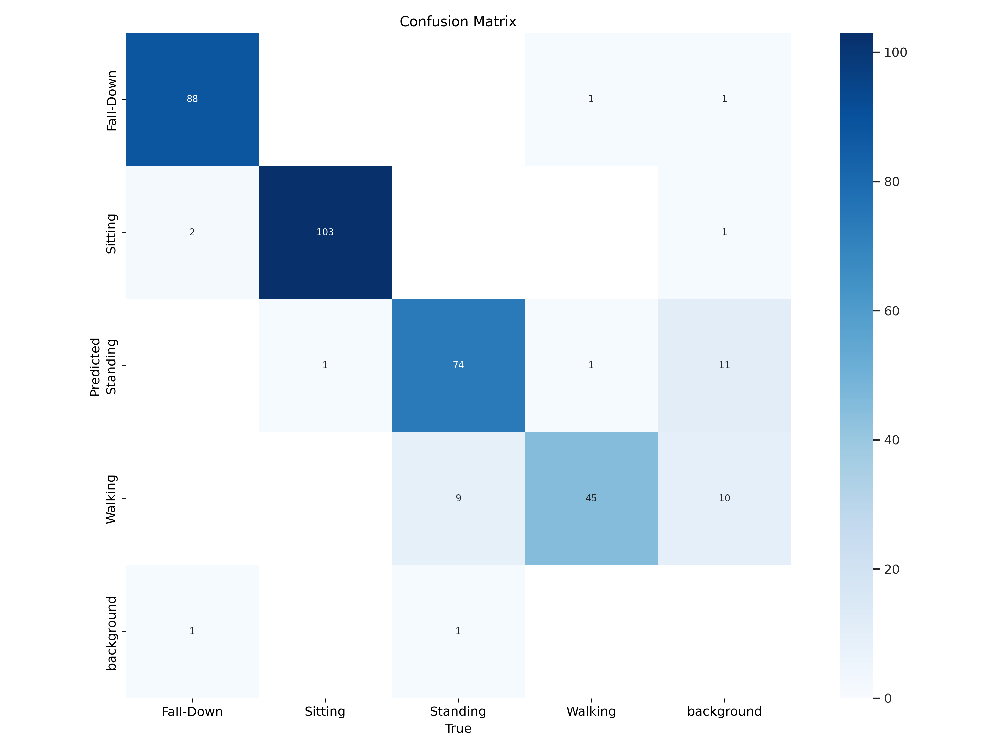

In [22]:
from IPython.display import Image, display
Image("/content/runs/pose/train2/confusion_matrix.png", width = 800)

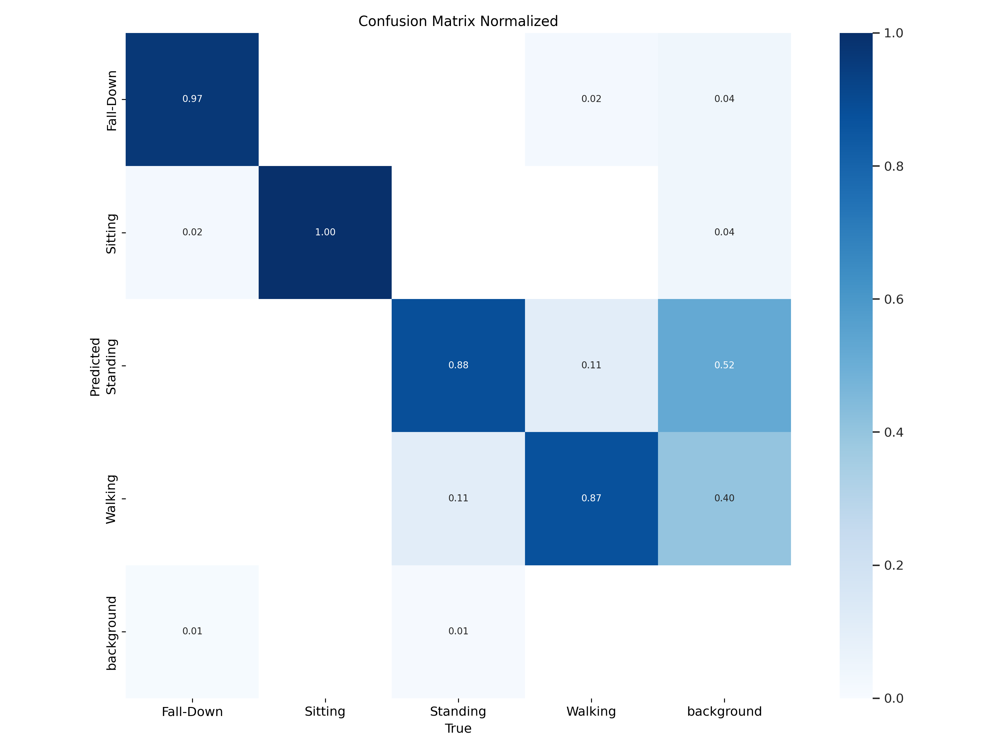

In [ ]:
from IPython.display import Image, display
Image("/content/runs/pose/train2/confusion_matrix_normalized.png", width = 800)

**Percision Curve**

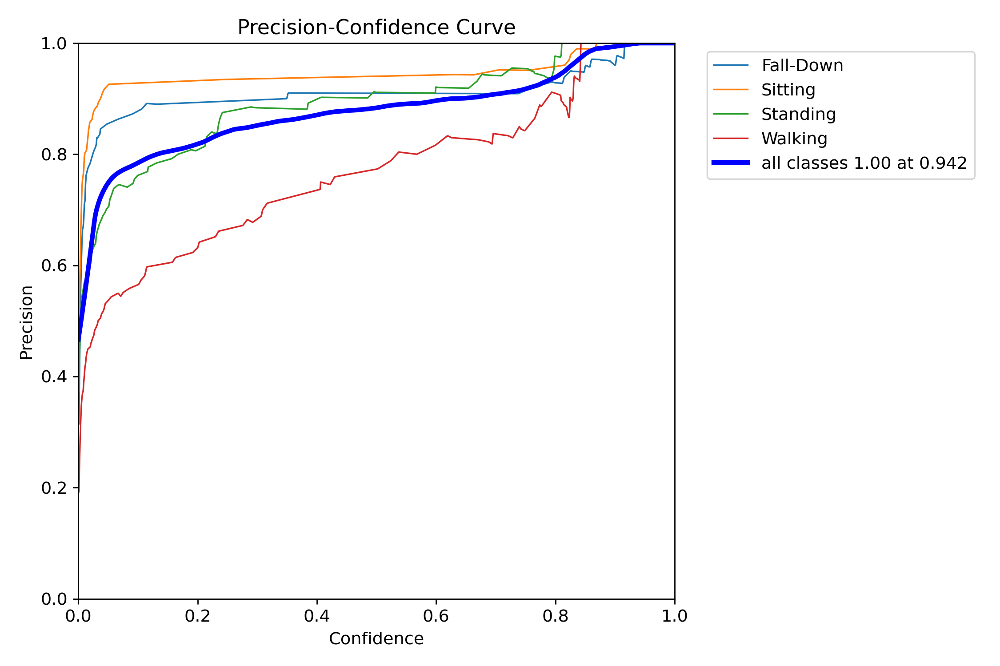

In [24]:
Image("/content/runs/pose/train2/PoseP_curve.png", width = 900)

**Recall Curve**

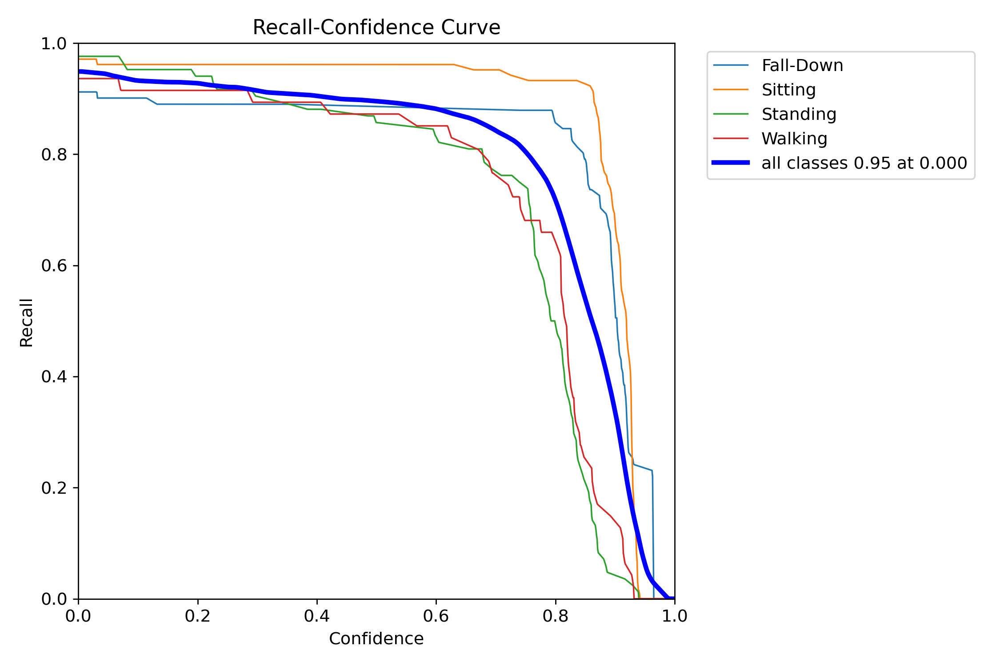

In [25]:
Image("/content/runs/pose/train2/PoseR_curve.png", width = 800)

**Model Predictions on Validation Batch**

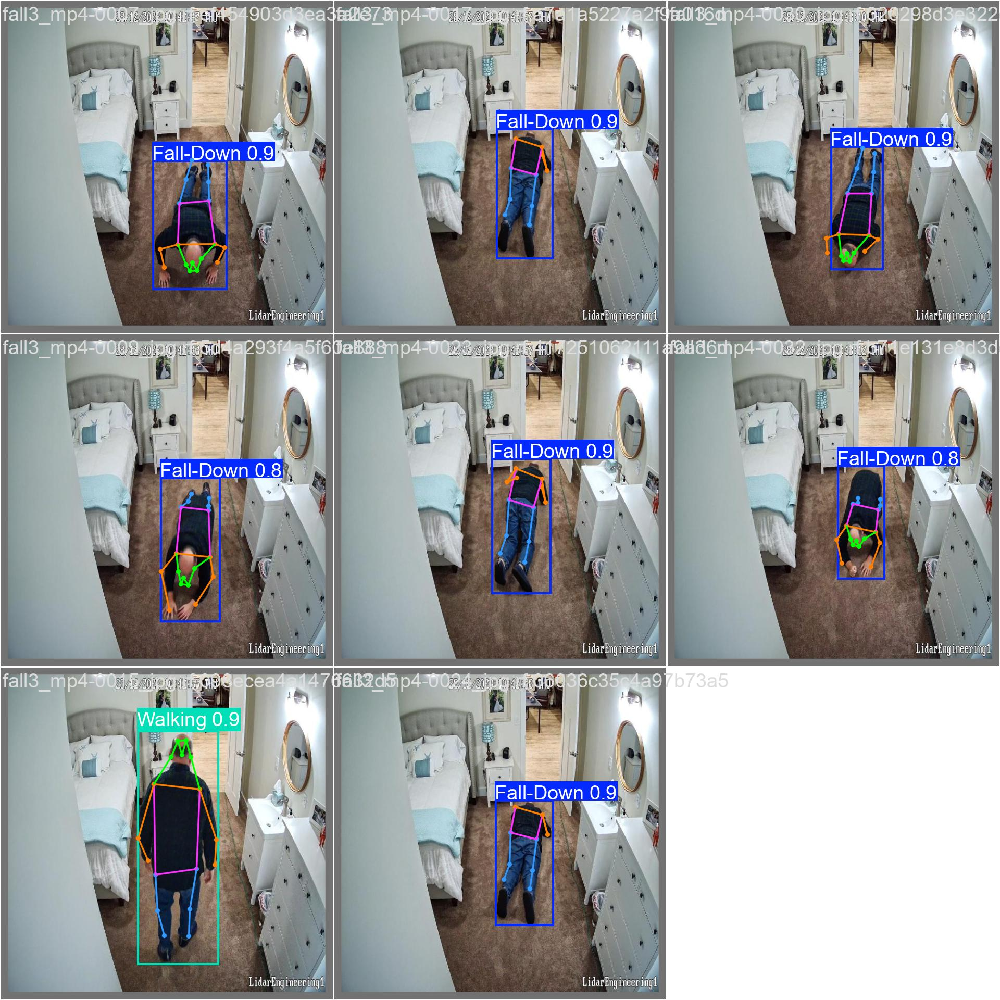

In [26]:
Image("/content/runs/pose/train2/val_batch1_pred.jpg", width = 800)

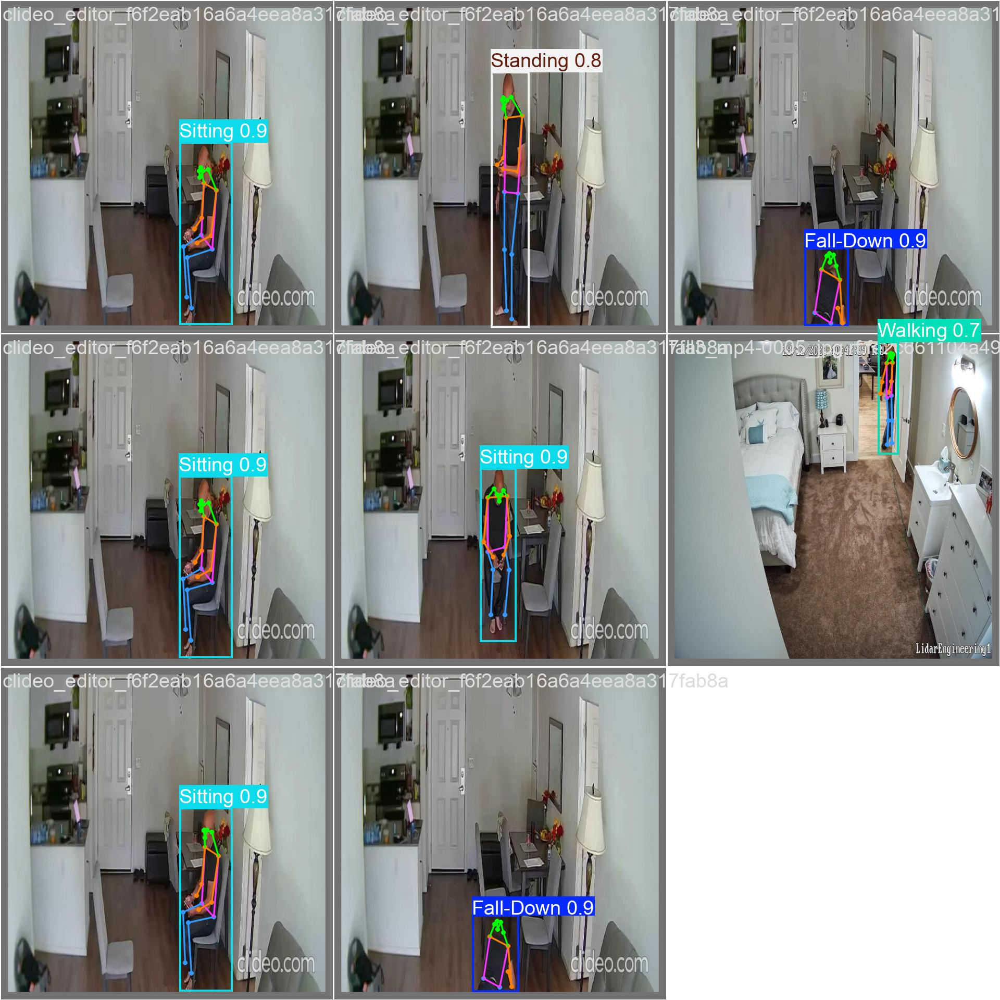

In [27]:
Image("/content/runs/pose/train2/val_batch2_pred.jpg", width = 800)

**Step # 09 Inference on Test Dataset Images using the Trained/ Fine-Tune Pose Estimation Model**

In [58]:
!gdown "https://drive.google.com/uc?id=1H3cfzzH9v3T9k9TNj8oaUy_sf-PH1kTA&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1H3cfzzH9v3T9k9TNj8oaUy_sf-PH1kTA&confirm=t
To: /content/best.pt
100% 20.2M/20.2M [00:00<00:00, 54.9MB/s]


In [72]:
#Load Trained Model
model = YOLO("/content/best.pt")
#Specify the test folder path
test_path = "/content/dataset/test/images"
#List all the images in the test folder
import os
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

#Predict each images
for img_path in image_files:
  results = model.predict(source = img_path, save = True, conf = 0.25)


image 1/1 /content/dataset/test/images/clideo_editor_34dad907ac934700be10a61cf7916a27_mp4-0052_jpg.rf.01c194853ffc8b99399ddb08cb0f26c0.jpg: 640x640 1 Fall-Down, 1 Standing, 1 Walking, 17.0ms
Speed: 3.1ms preprocess, 17.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict3

image 1/1 /content/dataset/test/images/clideo_editor_454ae88c0d8f4113a208876eb58e9b67_mp4-0125_jpg.rf.0ca60ff726df353362052bc5dfbaeaca.jpg: 640x640 1 Sitting, 17.1ms
Speed: 2.2ms preprocess, 17.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict3

image 1/1 /content/dataset/test/images/Screenshot-2024-09-25-at-8-43-41-PM_png.rf.1b34e7fd2dfc832c10eb8b0968fe403e.jpg: 640x640 1 Standing, 1 Walking, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict3

image 1/1 /content/dataset/test/images/clideo_editor_454ae88c0d8f4113a208876eb58e9

**Step # 10 Plot Prediction on Test Images**

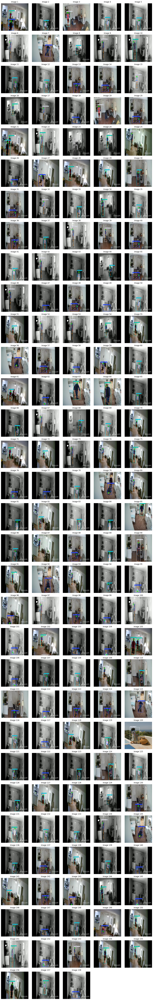

In [73]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Plot prediction on test images

# Specify the predict folder path
pred_path = '/content/runs/pose/predict'

# List all images in the predict folder
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Number of images per row
images_per_row = 5

# Calculate the number of rows needed
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Set figure size
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Flatten axes if necessary (for easier iteration)
axs = axs.flatten()

# Loop through each image and display it
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Read the image
    axs[i].imshow(img)                # Show the image
    axs[i].axis('off')                # Turn off axis
    axs[i].set_title(f"Image {i+1}")  # Add title

# Hide any extra empty subplots (if the number of images is not a perfect multiple of images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Hide unused axes

# Display all images
plt.tight_layout()
plt.show()


**Step # 10 Inference on Video**

In [74]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [75]:
!gdown "https://drive.google.com/uc?id=19jREqMUWoJgixJgwgeHvvsPu82neJITp&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=19jREqMUWoJgixJgwgeHvvsPu82neJITp&confirm=t
To: /content/video1.mp4
100% 1.40M/1.40M [00:00<00:00, 12.9MB/s]


In [76]:
results = model.predict(source = "/content/video1.mp4", save = True, conf = 0.25, iou = 0.2)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/272) /content/video1.mp4: 384x640 (no detections), 14.2ms
video 1/1 (frame 2/272) /content/video1.mp4: 384x640 (no detections), 12.1ms
video 1/1 (frame 3/272) /content/video1.mp4: 384x640 (no detections), 12.0ms
video 1/1 (frame 4/272) /content/video1.mp4: 384x640 (no detections), 16.1ms
video 1/1 (frame 5/272) /content/video1.mp4: 384x640 (no detections), 12.0ms
video 1/1 (frame 6/272) /content/video1.mp4: 384x640 (no detections), 1

In [65]:
!rm "/content/result_compressed.mp4"

In [83]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/pose/predict3/video1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)